# Exercise 1

• The number of claims received by an insurance company during a week follows a Poisson distribution with unknown mean (µ)

• The number of claims, per week, observed over a ten week period are: 5, 8, 4, 6, 11, 6, 6, 5, 6, 4

a) Suppose to use a prior uniform distribution for µ
- Find the posterior distribution for µ and compute the posterior mean, median and variance
- Plot the posterior distribution and the 95% credibility interval

b) Suppose to use a Jeffreys’ prior for µ (g(µ) ∝ 1/sqrtµ)
- Find the posterior distribution for µ and compute the posterior mean, median and variance
- Plot the posterior distribution and the 95% credibility interval

c) Evaluate a 95% credibility interval for the results obtained with both priors. Compare the result
with that obtained using a normal approximation for the posterior distribution, with the same
mean and standard deviation


Prior,Mean,Variance,Median,CredibilityLimitInf,CredibilityLimitSup,GaussLimitInf,GaussLimitSup
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Uniform,6.20,0.620,6.166699,4.753504,7.835705,4.656723,7.743277
Jeffrey,6.15,0.615,6.116699,4.709748,7.779460,4.612958,7.687042


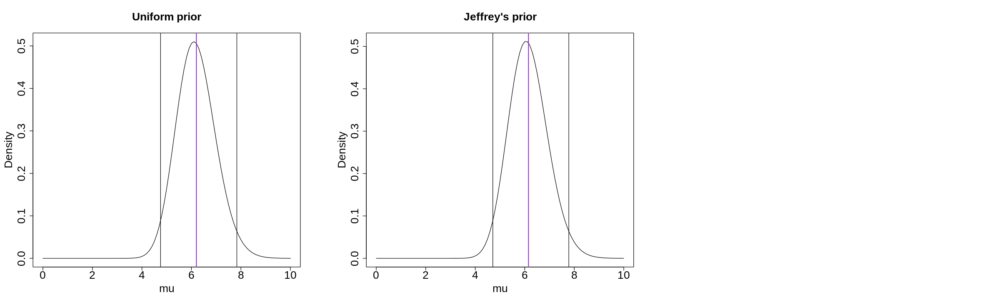

In [1]:
claims <- c(5, 8, 4, 6, 11, 6, 6, 5, 6, 4)
limits <- c(0, 20)

# pdf and quantile function for the posterior with uniform prior
dpost.unif <- function(mu, y){dgamma(mu, shape = sum(y) + 1, rate = sum(y != 0))}
qpost.unif <- function(mu, y){qgamma(mu, shape = sum(y) + 1, rate = sum(y != 0))}

# pdf and quantile function for the posterior with Jeffrey's prior
dpost.jeff <- function(mu, y){dgamma(mu, shape = sum(y) + 1/2, rate = sum(y != 0))}
qpost.jeff <- function(mu, y){qgamma(mu, shape = sum(y) + 1/2, rate = sum(y != 0))}

mean   <- c()
mean   <- append(mean, integrate(function(x) x * dpost.unif(x, claims), lower=limits[1], upper=limits[2])$value)
mean   <- append(mean, integrate(function(x) x * dpost.jeff(x, claims), lower=limits[1], upper=limits[2])$value)
                              
var    <- c()
var    <- append(var, integrate(function(x) x^2 * dpost.unif(x, claims), lower=limits[1], upper=limits[2])$value - mean[1]^2)
var    <- append(var, integrate(function(x) x^2 * dpost.jeff(x, claims), lower=limits[1], upper=limits[2])$value - mean[2]^2)
                              
median <- c()
median <- append(median, qpost.unif(0.5, claims))
median <- append(median, qpost.jeff(0.5, claims))
                 
cred.limits <- c(0.025, 0.975)
crint <- c()
crint <- append(crint, qpost.unif(cred.limits,claims))
crint <- append(crint, qpost.jeff(cred.limits,claims))
                               
crint.gauss <- c()
crint.gauss <- append(crint.gauss, qnorm(cred.limits, mean = mean[1], sd = sqrt(var[1])))
crint.gauss <- append(crint.gauss, qnorm(cred.limits, mean = mean[2], sd = sqrt(var[2])))
                
# Summarise the results in a dataframe
results = data.frame(Prior = c('Uniform', 'Jeffrey'),
                     Mean  = mean,
                     Variance = var,
                     Median = median,
                     CredibilityLimitInf = crint[c(1,3)],
                     CredibilityLimitSup = crint[c(2,4)],
                     GaussLimitInf = crint.gauss[c(1,3)],
                     GaussLimitSup = crint.gauss[c(2,4)])
                               
# Plot the posterior distribution
                                
options(repr.plot.width=20, repr.plot.height=6)
# Set the #columns, title size, axis label size, tick label size, margins within plots
par(mfrow = c(1, 3), cex.main = 2, cex.lab = 2, cex.axis = 2, mar = c(5, 5, 5, 5))    
                               
curve(dpost.unif(x, claims), from = 0, to = 10, main = "Uniform prior", xlab = "mu", ylab = "Density")
abline(v=crint[1])
abline(v=crint[2])
abline(v=mean[1], col="darkorchid", lwd=1.7)
                               
curve(dpost.jeff(x, claims), from = 0, to = 10, main = "Jeffrey's prior", xlab = "mu", ylab = "Density")
abline(v=crint[3])
abline(v=crint[4])
abline(v=mean[2], col="darkorchid", lwd=1.7)
                                
results

# Exercise 2


A well established and diffused method for detecting a disease in blood fails to detect the presence
of disease in 15% of the patients that actually have the disease.

• A young UniPD startUp has developed an innovative method of screening. During the qualification
phase, a random sample of n = 75 patients known to have the disease is screened using the new
method.


a) What is the probability distribution of y, the number of times the new method fails to detect the
disease ? <br><br>
_It is a binomial._ <br><br>
b) On the n = 75 patients sample, the new method fails to detect the disease in y = 6 cases. What is
the frequentist estimator of the failure probability of the new method ?


In [2]:
# Fail to detect disease (old method)
p0 <- 0.15

# Number of patients, number of failures in detection (new method) 
n <- 75
y <- 6

p <- y / n

cat("Failure to detect the disease with new method:", p, "%")

Failure to detect the disease with new method: 0.08 %

c) setup a bayesian computation of the posterior probability, assuming a beta distribution with mean
value 0.15 and standard deviation 0.14. Plot the posterior distribution for p, and mark on the plot
the mean value and variance

In [3]:
# Prior density function
beta = function(p, m, s, ms=TRUE){
    
    if(ms == TRUE){    
        a <- m^2 * (1 - m) / s^2 - m
        b <- ((1 - m) * (m * (1 - m) / s^2 - 1))
    }
    else{
        a <- m
        b <- s
    }
    
    dbeta(p, a, b)
}

# Likelihood function 
likelihood = function(p, y, n){
    
    norm <- integrate(function(x) dbinom(y, n, x), lower = 0, upper = 1)[[1]]
    return (dbinom(y, n, p) / norm)
}

# Posterior density function
dpost = function(prior, m, s, ms=TRUE){ function(p, y, n){
    
    likelihood(p, y, n) * prior(p, m, s, ms) / integrate(function(x) likelihood(x, y, n) * prior(x, m ,s, ms), lower = 0, upper = 1)[[1]]
}}

Mean: 0.08478674 
Variance: 0.0009520625

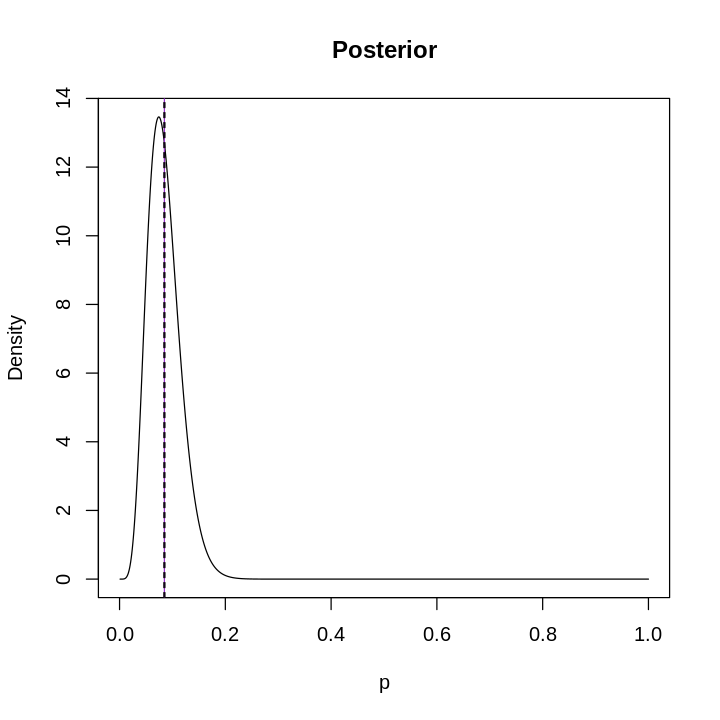

In [4]:
m <- 0.15
s <- 0.14

mean   <- integrate(function(x) x   * dpost(beta,m,s)(x, y, n), lower=0, upper=1)$value
var    <- integrate(function(x) x^2 * dpost(beta,m,s)(x, y, n), lower=0, upper=1)$value - mean[1]^2

options(repr.plot.width=6, repr.plot.height=6)
curve(dpost(beta,m,s)(x, y, n), from = 0, to = 1, n=1000, main = "Posterior", xlab = "p", ylab = "Density")
abline(v=mean, col="darkorchid")
abline(v=mean-var, lty=2)
abline(v=mean+var, lty=2)
                   
cat("Mean:", mean, "\nVariance:", var)

d) Perform a test of hypothesis assuming that if the probability of failing to the detect the desease in
ill patients is greater or equal than 15%, the new test is no better that the traditional method. Test
the sample at a 5% level of significance in the Bayesian way.


p-value: 0.04971331

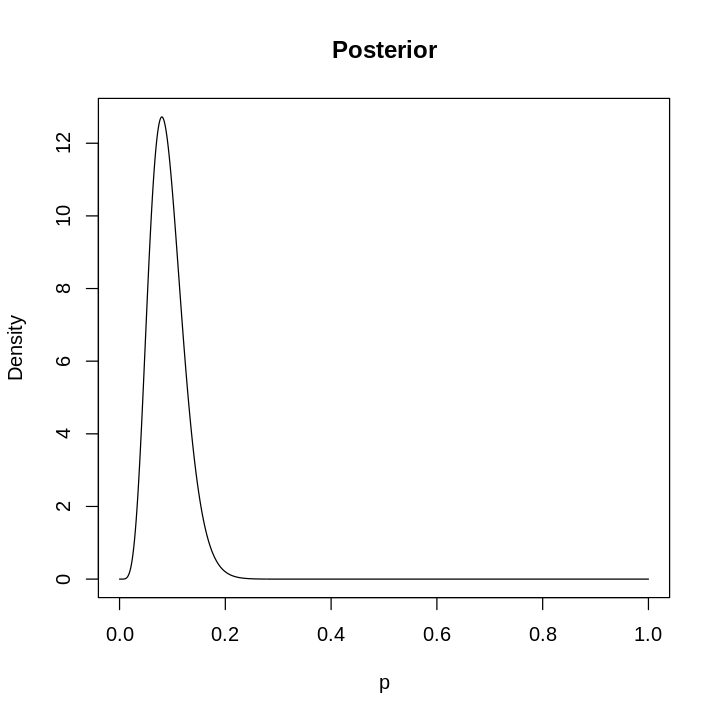

In [5]:
# Uniform prior
curve(dpost(beta,1,1,FALSE)(x, y, n), from = 0, to = 1, n=1000, main = "Posterior", xlab = "p", ylab = "Density")

# Calculate the p-value
p <- integrate(function(x) dpost(beta,1,1,FALSE)(x, y, n), lower = p0, upper = 1)$value
              
cat('p-value:', p)

_The p-value is smaller than 0.05, therefore the new test is better than the traditional method_ <br>
e) Perform the same hypothesis test in the classical frequentist way. <br>
- _The null hypothesis is p >= 0.15, the alternative hypothesis p < 0.15._
- _The null distribution is a Binom(y | n = 75, p = 0.15)_
- _The significance level is fixed to 0.05_
- _Using Fisher's method, we calculate the p-value, then reject the null hypothesis if the p-value is lower than 0.05_

p-value = 0.0543533

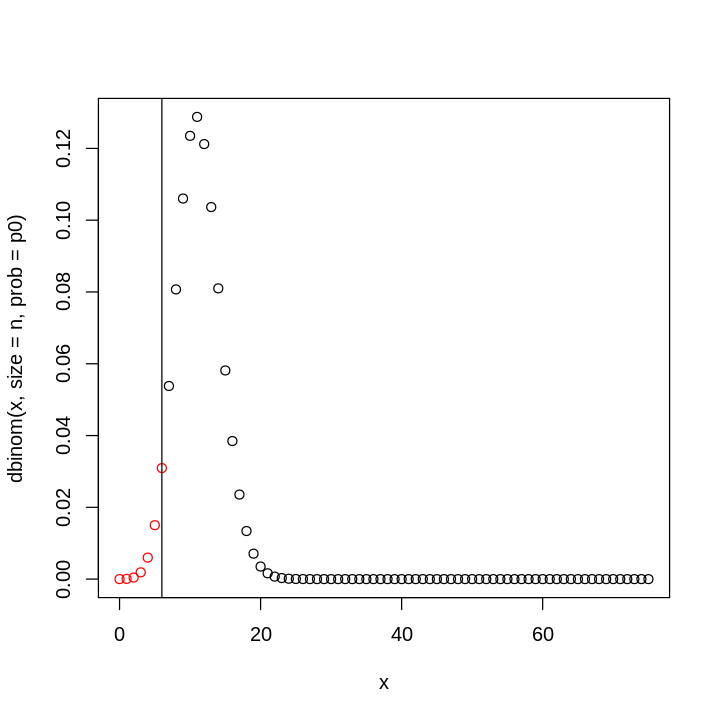

In [6]:
library(geometry)

x <- seq(0,n)

# prior distribution (zoom in)
colour_vector = ifelse(x <= y, "red", "black")
plot(x, dbinom(x, size=n, prob=p0), col=colour_vector)
abline(v=y)

p <- sum(dbinom(x, size=75, prob=0.15)[x <= 6])

cat('p-value =', p)

_The p-value is greater than 0.05, therefore we must accept the null hypothesis: we cannot state that the new test is more reliable than the old one._

## Exercise 3
#### Given the problem of the lightouse discussed last week, study the case in which both the position along the shore (α) and the distance out at sea (β) are unknown

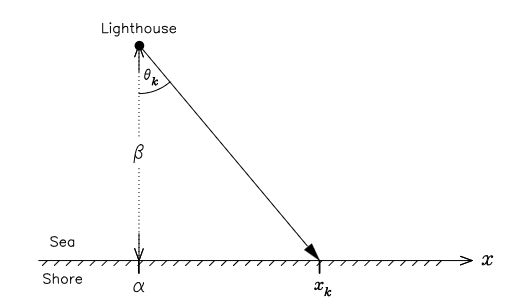

We can assume $\alpha$ &perp; $\beta$, this implies $p(\alpha , \beta|\{x_k\}) \propto p(\{x_k\}|\alpha , \beta)p(\alpha) p(\beta) $ <br>
If we assume $\beta$ to be uniform over an interval $[ 0, y_{max}]$ we get that $p(\alpha , \beta|\{x_k\}) \propto p(\{x_k\}|\alpha , \beta)$

In [7]:
# Unkonwn true values (used to simulate the dataset)
alpha <- 10
beta  <- 20

set.seed(1234)   
n.sample <- 200
x.min <- 0; x.max <- +30
y.min <- 0; y.max <- +40

# Spacing
h_a <- (x.max - x.min )/n.sample
h_b <- (y.max - y.min )/n.sample

alphas <- seq(from=x.min , by=h_a, length.out=n.sample +1) 
betas <- seq(from=y.min , by=h_b, length.out=n.sample +1) 

# Generate n.sample random numbers between -pi/2 and pi/2
theta_k <- runif(n.sample*2,-pi/2,pi/2)

# Construct the x_k observation points with the "unknown" alpha and beta and the sampled theta angles
x_k <- beta * tan(theta_k) + alpha

In [8]:
# Vectorize(function) allows a function that was originally designed to operate on scalar values to operate on vectors (alpha, beta) as well
# outer applies function to all possible values of alphas and betas
log_posterior <- outer(alphas, betas, Vectorize(function(a, b) sum(log((b/pi) / (b^2 + (x_k - a)^2)))))

# This function is used to obtain the actual shape of the posterior (not the log one) 
# It also scales the values between 0 and 1 
posterior_shape = function(log_posterior) {                 
    log_param_max <- max(log_posterior)            
    params        <- exp(log_posterior - log_param_max) # subtract from L_max, and exponentiate, then the max value will be 1
    params                                         
}

In [9]:
grid <- posterior_shape(log_posterior)

# find the maximum value and its indices
max_val <- max(grid)
max_indices <- which(grid == max_val, arr.ind = TRUE)

# From indices to alpha, beta values
m_a <- max_indices[1]*h_a 
m_b <- max_indices[2]*h_b

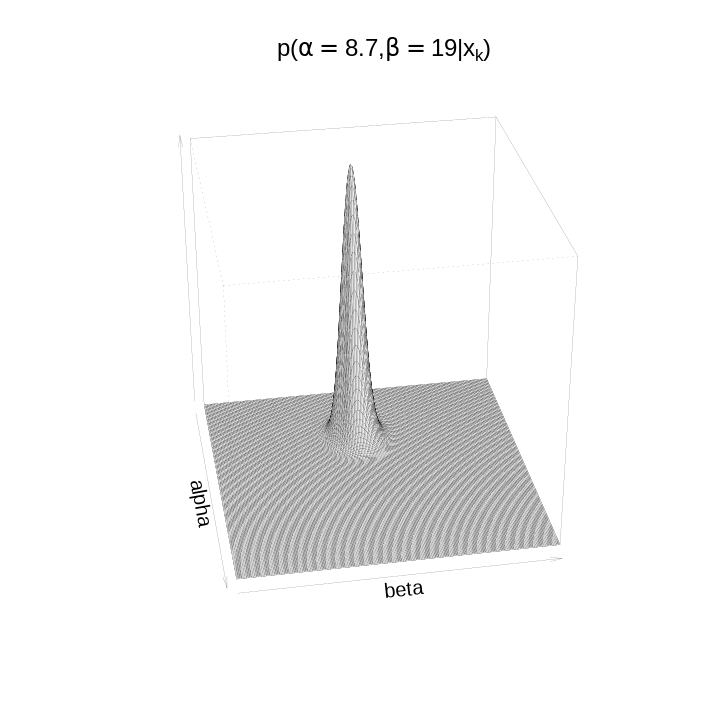

In [10]:
# Plot the posterior
persp(alphas, betas, grid,
      xlab=bquote(alpha), ylab=bquote(beta), zlab="", 
      main="", cex=0.7, lwd=0.1, 
      xlim=c(x.min, x.max), ylim=c(0, y.max), zlim=c(0, 1),
      theta=80, phi=30, d=5.0, shade=0.05)

# Add title with maximum values
title(bquote(paste(p, "(", alpha == .(m_a), ",",
                   beta == .(m_b), "|", x[k], ")")))


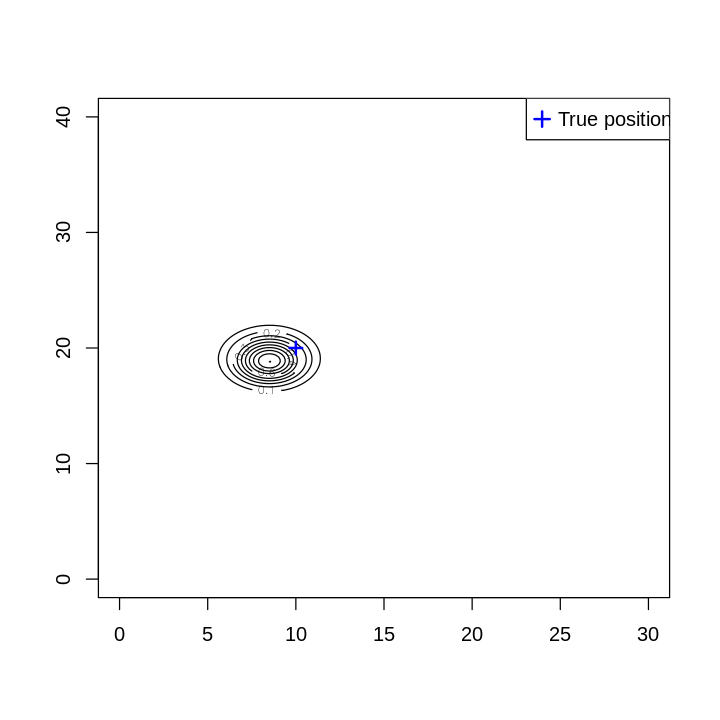

In [11]:
# With n.sample too big the 3D plot doesn't compute, so here's a contour plot that permits to visualize the data eitherway
contour(alphas, betas, grid, xlim=c(0,30), ylim=c(0,40))
points(alpha, beta, pch=3, col="blue", lwd=2) # true value
legend("topright",c("True position"), col="blue", pch=3, pt.cex=1.2, pt.lwd=2) 

# Exercise 4
### Given the Signal over Background example discussed last week, analyze and discuss the following cases:
1) Vary the sampling resolution used to generate the data, keeping the same sampling range xdat <- seq(from=-7*w, to=7*w, by=0.5*w)
- Change the resolution w = {0.1, 0.25, 1, 2, 3}
- Check the effect on the results

In [12]:
# Generative model

signal <- function (x, a, b, x0, w, t) {
    t * (a*exp(-(x-x0)^2/(2*w^2)) + b)
}

# Log posterior
log.post <- function (d, x, a, b, x0, w, t) {
    if(a<0 || b <0) {return(-Inf )} # the effect of the prior
    sum(dpois(d, lambda=signal(x, a, b, x0, w, t), log=TRUE ))
}

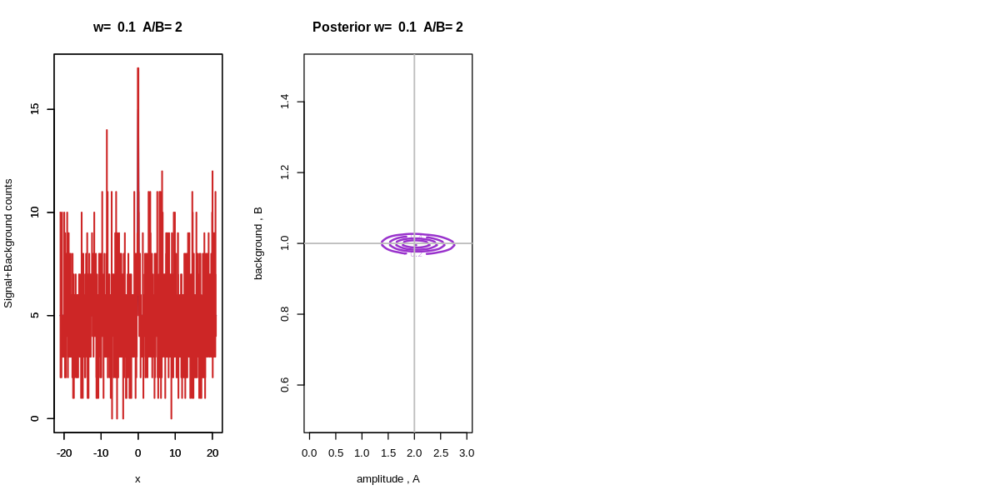

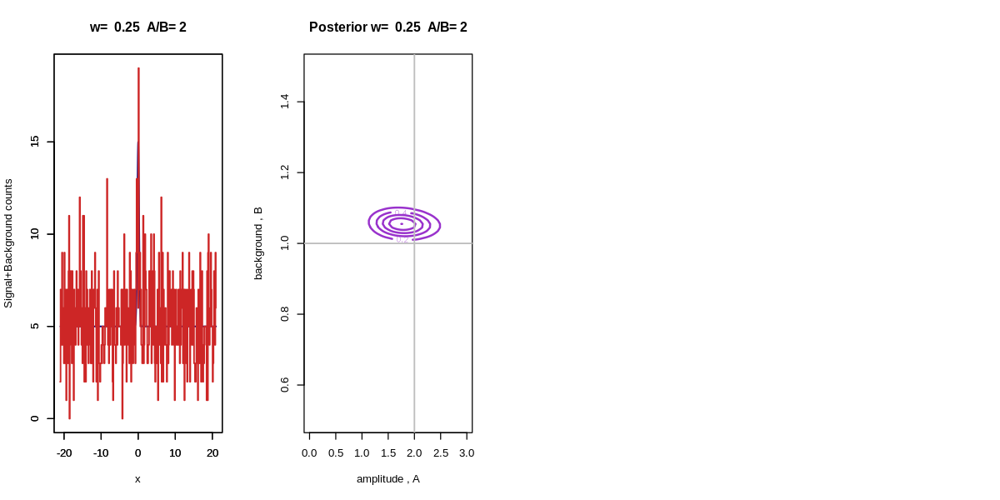

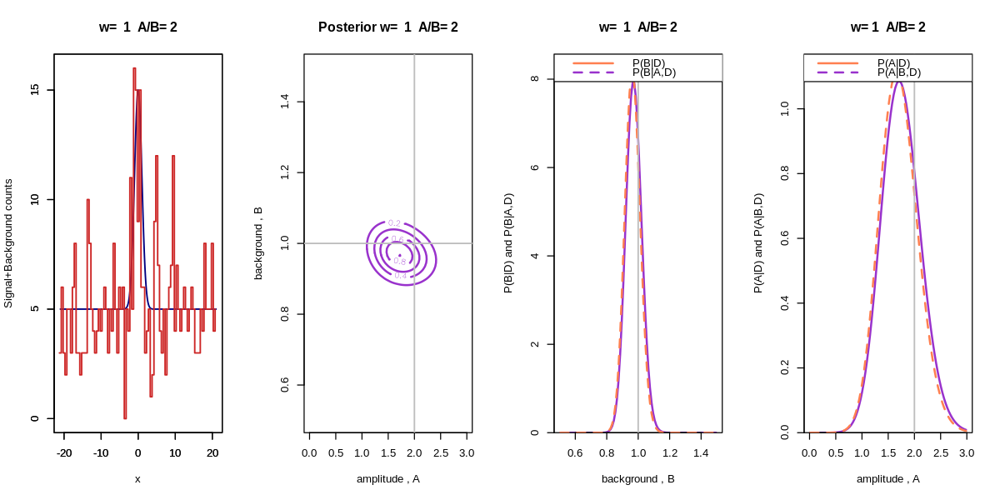

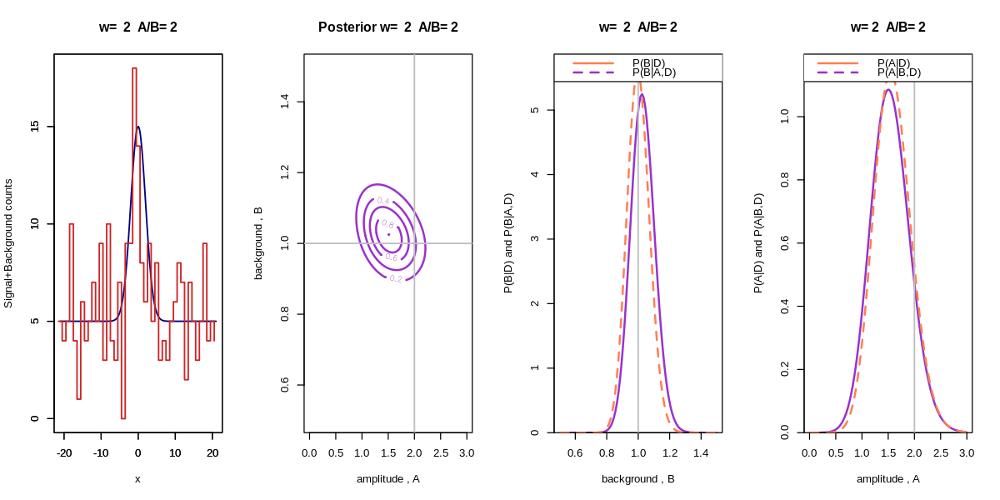

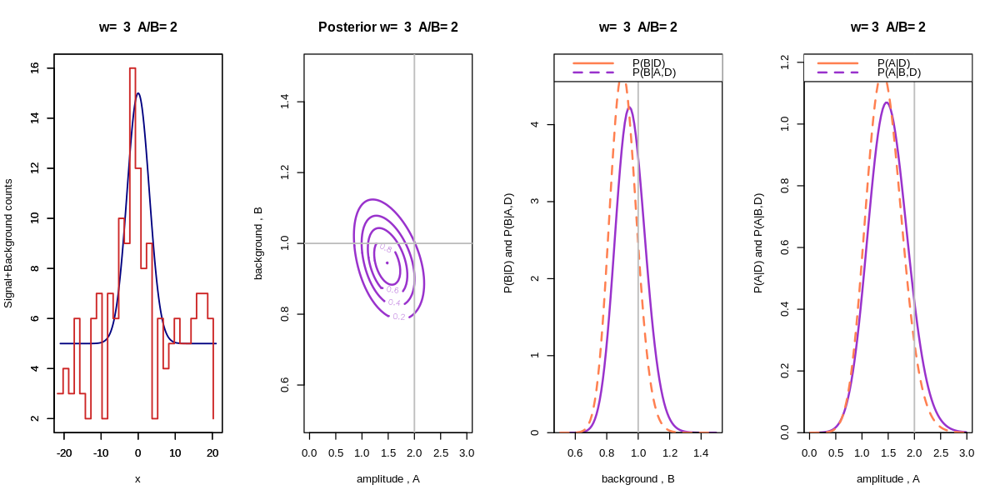

In [20]:
# Define model parameters
x0      <- 0 # Signal peak
w.i     <- c(0.1, 0.25, 1, 2, 3) # Signal width
A.true  <- 2 # Signal amplitude
B.true  <- 1 # Background amplitude
Delta.t <- 5 # Exposure time
range   <- max(w.i)*7
set.seed(205)


# Function that returns a run of the experiment
experiment <- function(x0, w, A.true, B.true, Delta.t){
    
    # Generate the observed data
    # Define the vectors to plot the observation and the expected values of the experiment 
    
    xdat   <- seq(from=-range, to=range, by=0.5*w)
    s.true <- signal(xdat, A.true , B.true , x0, w, Delta.t)
    ddat   <- rpois(length(s.true), s.true)
    xplot  <- seq(from=min(xdat), to=max(xdat), by=0.05*w)
    splot  <- signal(xplot , A.true , B.true , x0, w, Delta.t)
    xdat.off <- xdat-w/4
    
    # Sampling grid to compute the posterior
    alim  <- c(0.0, A.true+min(c(2, A.true/2)))
    blim  <- c(0.5, B.true+min(c(2, B.true/2)))
    Nsamp <- 100
    uniGrid <- seq(from=1/(2*Nsamp), to=1-1/(2*Nsamp), by=1/Nsamp)
    delta_a <- diff(alim)/ Nsamp
    delta_b <- diff(blim)/ Nsamp
    a <- alim[1] + diff(alim)* uniGrid
    b <- blim[1] + diff(blim)* uniGrid
    
    # Compute log unnormalized posterior, z = ln Pˆ*(a,b|D), on a regular grid
    z <- matrix(data=NA, nrow=length(a), ncol=length(b)) 
    for(j in 1:length(a)) {
        for(k in 1:length(b)) {
            z[j,k] <- log.post(ddat, xdat, a[j], b[k], x0, w, Delta.t)
        } 
    }
    z <- z - max(z) #set maximum to zero
    
    # Marginalization
    p_a_D <- apply(exp(z), 1, sum)
    p_a_D <- p_a_D/(delta_a*sum(p_a_D))
    p_b_D <- apply(exp(z), 2, sum) 
    p_b_D <- p_b_D/(delta_b*sum(p_b_D))
    
    p_a_bD <- exp(Vectorize(log.post, "a")(ddat, xdat, a, B.true, x0, w, Delta.t))
    p_a_bD <- p_a_bD/(delta_a*sum(p_a_bD))
    p_b_aD <- exp(Vectorize(log.post, "b")(ddat, xdat, A.true, b, x0, w, Delta.t))
    p_b_aD <- p_b_aD/(delta_b*sum(p_b_aD))
    
    par(mfrow=c(1,4))

    # Plot data 
    plot(xplot, splot, ylim=range(c(splot, ddat)), xlab="x", ylab="Signal+Background counts", type="l", col="navy", lwd=1.5, main=paste('w= ',w,' A/B=',A.true/B.true))
    par(new=TRUE)
    plot(xdat.off, ddat, type='s', col='firebrick3', lwd=1.5, xlab="", ylab="", xlim=range(xplot), ylim=range(c(splot, ddat)))
    
    # Plot unnormalized 2D posterior as contours. 
    contour (a, b, exp(z),
             nlevels = 5,
             labcex = 0.5,
             lwd = 2,
             xlab="amplitude , A",
             ylab="background , B",
             main=paste('Posterior w= ',w,' A/B=',A.true/B.true),
             col="darkorchid")
    abline(v=A.true,h=B.true,col="grey", lwd=1.5)
    
    # The p_b_aD and p_a_bD of the smallest w cannot be computed (log posterior = 0) 
    if (w>=0.5){
        # Plot the 1D marginalized posteriors
        plot(b, p_b_D, xlab="background , B", yaxs="i", col="darkorchid", ylim=1.05*c(0,max(p_b_D, p_b_aD)), ylab="P(B|D) and P(B|A,D)", type="l", lwd=2, main=paste('w= ',w,' A/B=',A.true/B.true))
        lines(b, p_b_aD, lwd=2, lty=2, col="coral")
        abline(v=B.true, col="grey", lwd=1.5)
        legend("topleft", legend=c("P(B|D)", "P(B|A,D)"), col=c("coral", "darkorchid"), lty=c(1,2), lwd=2)
        plot(a, p_a_D, xlab="amplitude , A", yaxs="i", col="darkorchid", ylim=1.05*c(0,max(p_a_D, p_a_bD)), ylab="P(A|D) and P(A|B,D)", type="l", lwd=2, main=paste('w=',w,' A/B=',A.true/B.true))
        lines(a, p_a_bD, lwd=2, lty=2, col="coral")
        abline(v=A.true , col="grey", lwd=1.5)
        legend("topright", legend=c("P(A|D)", "P(A|B,D)"), col=c("coral", "darkorchid"), lty=c(1,2), lwd=2)
    }
    }

options(repr.plot.width=10, repr.plot.height=5)

for (w in w.i){
 experiment(x0, w, A.true, B.true, Delta.t)   
}

We can clearly observe than with a smaller resolution, the contour of the posterior are larger and consequently less peaked around the true value. <br>
Also, the 1D marginalizded posterior peak is moving further from the true value.

2) change the ratio A/B used to simulate the data (keeping both positive in accordance with the prior)
- Check the effect on the results

In [ ]:
# Redefine model parameters
w       <- 1 # Signal width
A.true  <- c(1, 5, 10, 30, 50) # Signal amplitude

options(repr.plot.width=10, repr.plot.height=5)

for (a in A.true) experiment(x0, w , a, B.true, Delta.t)     

In this case we can see that, with an increasing ratio A/B, the data signal in the "Signal+Background counts" graph is less influenced by the background so the experiment curve fits better with the theoretical curve (as expected). 